# Import des librairies

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn

# Functions
Cette section regroupe toutes les fonctions et leurs descriptions qui seront utilisées dans ce projet.

In [2]:
"""path is a directory path in the form of r"XXX\XXX"
"""
def importDataFrames(path):
    import os
    import pandas as pd
    os.chdir(path)
    files = os.listdir(os.getcwd())
    dfs = [pd.read_csv(files) for files in files]
    print(files)
    return(dfs)

"""df is a pandas data frame
"""
def summary(df): 
    if isinstance(df, pd.DataFrame):
        result = []
        info = df.shape
        for a in range(len(df.columns)):
            type = df.dtypes[a]
            name = df.columns[a]
            nNa = df.iloc[:,a].isnull().sum()
            uniques = df.iloc[:,a].nunique()
            
            if type == "float64" or type == "int64":
                Min = df.iloc[:,a].min()
                Max = df.iloc[:,a].max()
                mean = df.iloc[:,a].mean()
                sd = df.iloc[:,a].std()
            else:
                Min = float("NAN")
                Max = float("NAN")
                mean = float("NAN")
                sd = float("NAN")
                
            result.append([name, type, info[0], info[1] ,nNa, uniques, Min, Max, mean, sd]) 
        result = pd.DataFrame(result)
        result.columns =["colName", "type", "nRows", "nCols" ,"nNa", "uniques", "Min", "Max", "mean", "sd"]
        return pd.DataFrame(result)

"""df is a pandas data frame
"""
def formatColName(df):
    df.columns = df.columns.str.replace(' ', '')
    return df

import math
def scale(data, colum):
    mean = data[colum].mean()
    sd = data[colum].std()
    vec = data[colum].values.tolist()
    
    result=[]
    for a in range(len(vec)):
        if math.isnan(vec[a]):
            result.append(np.nan)
        else:
            result.append((vec[a] - mean)/sd)
    return result

# Importation des données

In [3]:
dfs = importDataFrames(r"C:\Users\SSosa\OneDrive\Bureau\Travail\Formation\Projets\1\data")

['EdStatsCountry-Series.csv', 'EdStatsCountry.csv', 'EdStatsData.csv', 'EdStatsFootNote.csv', 'EdStatsSeries.csv']


Formatage des noms de colonnes.

In [4]:
dfs = [formatColName(item) for item in dfs]

# Exploration des données

## Tableau 1

In [5]:
dfs[0].head()

,CountryCode,SeriesCode,DESCRIPTION,Unnamed:3
0,ABW,SP.POP.TOTL,Data sources : United Nations World Population...,NaN
1,ABW,SP.POP.GROW,Data sources: United Nations World Population ...,NaN
2,AFG,SP.POP.GROW,Data sources: United Nations World Population ...,NaN
3,AFG,NY.GDP.PCAP.PP.CD,Estimates are based on regression.,NaN
4,AFG,SP.POP.TOTL,Data sources : United Nations World Population...,NaN


On verifie que la colonne 4 soit entièrement vide

In [6]:
dfs[0].iloc[:,3].isnull().sum() /dfs[0].shape[0]

1.0

On la supprime

In [7]:
dfs[0].drop(["Unnamed:3"], axis= 1, inplace = True)
dfs[0]

,CountryCode,SeriesCode,DESCRIPTION
0,ABW,SP.POP.TOTL,Data sources : United Nations World Population...
1,ABW,SP.POP.GROW,Data sources: United Nations World Population ...
2,AFG,SP.POP.GROW,Data sources: United Nations World Population ...
3,AFG,NY.GDP.PCAP.PP.CD,Estimates are based on regression.
4,AFG,SP.POP.TOTL,Data sources : United Nations World Population...
...,...,...,...
608,ZAF,SP.POP.GROW,"Data sources : Statistics South Africa, United..."
609,ZMB,SP.POP.GROW,Data sources: United Nations World Population ...
610,ZMB,SP.POP.TOTL,Data sources : United Nations World Population...
611,ZWE,SP.POP.TOTL,Data sources : United Nations World Population...


In [8]:
summary(dfs[0])

,colName,type,nRows,nCols,nNa,uniques,Min,Max,mean,sd
0,CountryCode,object,613,3,0,211,NaN,NaN,NaN,NaN
1,SeriesCode,object,613,3,0,21,NaN,NaN,NaN,NaN
2,DESCRIPTION,object,613,3,0,97,NaN,NaN,NaN,NaN


Le tableau 1 dispose d'informations descriptives et non quantifiables

## Tableau 2

In [9]:
dfs[1].head()

,CountryCode,ShortName,TableName,LongName,2-alphacode,CurrencyUnit,SpecialNotes,Region,IncomeGroup,WB-2code,...,IMFdatadisseminationstandard,Latestpopulationcensus,Latesthouseholdsurvey,SourceofmostrecentIncomeandexpendituredata,Vitalregistrationcomplete,Latestagriculturalcensus,Latestindustrialdata,Latesttradedata,Latestwaterwithdrawaldata,Unnamed:31
0,ABW,Aruba,Aruba,Aruba,AW,Aruban florin,SNA data for 2000-2011 are updated from offici...,Latin America & Caribbean,High income: nonOECD,AW,...,NaN,2010,NaN,NaN,Yes,NaN,NaN,2012.0,NaN,NaN
1,AFG,Afghanistan,Afghanistan,Islamic State of Afghanistan,AF,Afghan afghani,Fiscal year end: March 20; reporting period fo...,South Asia,Low income,AF,...,General Data Dissemination System (GDDS),1979,"Multiple Indicator Cluster Survey (MICS), 2010/11","Integrated household survey (IHS), 2008",NaN,2013/14,NaN,2012.0,2000,NaN
2,AGO,Angola,Angola,People's Republic of Angola,AO,Angolan kwanza,"April 2013 database update: Based on IMF data,...",Sub-Saharan Africa,Upper middle income,AO,...,General Data Dissemination System (GDDS),1970,"Malaria Indicator Survey (MIS), 2011","Integrated household survey (IHS), 2008",NaN,2015,NaN,NaN,2005,NaN
3,ALB,Albania,Albania,Republic of Albania,AL,Albanian lek,NaN,Europe & Central Asia,Upper middle income,AL,...,General Data Dissemination System (GDDS),2011,"Demographic and Health Survey (DHS), 2008/09",Living Standards Measurement Study Survey (LSM...,Yes,2012,2010.0,2012.0,2006,NaN
4,AND,Andorra,Andorra,Principality of Andorra,AD,Euro,NaN,Europe & Central Asia,High income: nonOECD,AD,...,NaN,2011. Population figures compiled from adminis...,NaN,NaN,Yes,NaN,NaN,2006.0,NaN,NaN


In [10]:
summary(dfs[1])

,colName,type,nRows,nCols,nNa,uniques,Min,Max,mean,sd
0,CountryCode,object,241,32,0,241,NaN,NaN,NaN,NaN
1,ShortName,object,241,32,0,241,NaN,NaN,NaN,NaN
2,TableName,object,241,32,0,241,NaN,NaN,NaN,NaN
3,LongName,object,241,32,0,241,NaN,NaN,NaN,NaN
4,2-alphacode,object,241,32,3,238,NaN,NaN,NaN,NaN
5,CurrencyUnit,object,241,32,26,152,NaN,NaN,NaN,NaN
6,SpecialNotes,object,241,32,96,131,NaN,NaN,NaN,NaN
7,Region,object,241,32,27,7,NaN,NaN,NaN,NaN
8,IncomeGroup,object,241,32,27,5,NaN,NaN,NaN,NaN
9,WB-2code,object,241,32,1,240,NaN,NaN,NaN,NaN


Le tableau 2 contient des informations relatives à la récolte de données mais pas de données

## Tableau 3

In [11]:
dfs[2].head()

,CountryName,CountryCode,IndicatorName,IndicatorCode,1970,1971,1972,1973,1974,1975,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed:69
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Arab World,ARB,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,54.822121,54.894138,56.209438,57.267109,57.991138,59.36554,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
summary(dfs[2])

,colName,type,nRows,nCols,nNa,uniques,Min,Max,mean,sd
0,CountryName,object,886930,70,0,242,NaN,NaN,NaN,NaN
1,CountryCode,object,886930,70,0,242,NaN,NaN,NaN,NaN
2,IndicatorName,object,886930,70,0,3665,NaN,NaN,NaN,NaN
3,IndicatorCode,object,886930,70,0,3665,NaN,NaN,NaN,NaN
4,1970,float64,886930,70,814642,24595,-1.435564,1.903929e+13,1.974772e+09,1.211687e+11
...,...,...,...,...,...,...,...,...,...,...
65,2085,float64,886930,70,835494,7335,-0.780000,3.337871e+06,7.176899e+02,2.496587e+04
66,2090,float64,886930,70,835494,7150,-0.650000,3.354746e+06,7.113072e+02,2.530183e+04
67,2095,float64,886930,70,835494,7044,-0.550000,3.351887e+06,7.034274e+02,2.556069e+04
68,2100,float64,886930,70,835494,6914,-0.450000,3.330484e+06,6.940296e+02,2.574189e+04


On peut apercevoir des premières données quatifiables dans le tableau 3

## Tableau 4

In [13]:
dfs[3].head()

,CountryCode,SeriesCode,Year,DESCRIPTION,Unnamed:4
0,ABW,SE.PRE.ENRL.FE,YR2001,Country estimation.,NaN
1,ABW,SE.TER.TCHR.FE,YR2005,Country estimation.,NaN
2,ABW,SE.PRE.TCHR.FE,YR2000,Country estimation.,NaN
3,ABW,SE.SEC.ENRL.GC,YR2004,Country estimation.,NaN
4,ABW,SE.PRE.TCHR,YR2006,Country estimation.,NaN


Données descriptives

In [14]:
summary(dfs[3])

,colName,type,nRows,nCols,nNa,uniques,Min,Max,mean,sd
0,CountryCode,object,643638,5,0,239,NaN,NaN,NaN,NaN
1,SeriesCode,object,643638,5,0,1558,NaN,NaN,NaN,NaN
2,Year,object,643638,5,0,56,NaN,NaN,NaN,NaN
3,DESCRIPTION,object,643638,5,0,9102,NaN,NaN,NaN,NaN
4,Unnamed:4,float64,643638,5,643638,0,NaN,NaN,NaN,NaN


## Tableau 5

In [15]:
dfs[4].head()

,SeriesCode,Topic,IndicatorName,Shortdefinition,Longdefinition,Unitofmeasure,Periodicity,BasePeriod,Othernotes,Aggregationmethod,...,Notesfromoriginalsource,Generalcomments,Source,Statisticalconceptandmethodology,Developmentrelevance,Relatedsourcelinks,Otherweblinks,Relatedindicators,LicenseType,Unnamed:20
0,BAR.NOED.1519.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15-19 with...,Percentage of female population age 15-19 with...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BAR.NOED.1519.ZS,Attainment,Barro-Lee: Percentage of population age 15-19 ...,Percentage of population age 15-19 with no edu...,Percentage of population age 15-19 with no edu...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BAR.NOED.15UP.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15+ with n...,Percentage of female population age 15+ with n...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BAR.NOED.15UP.ZS,Attainment,Barro-Lee: Percentage of population age 15+ wi...,Percentage of population age 15+ with no educa...,Percentage of population age 15+ with no educa...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BAR.NOED.2024.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 20-24 with...,Percentage of female population age 20-24 with...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
summary(dfs[4])

,colName,type,nRows,nCols,nNa,uniques,Min,Max,mean,sd
0,SeriesCode,object,3665,21,0,3665,NaN,NaN,NaN,NaN
1,Topic,object,3665,21,0,37,NaN,NaN,NaN,NaN
2,IndicatorName,object,3665,21,0,3665,NaN,NaN,NaN,NaN
3,Shortdefinition,object,3665,21,1509,1169,NaN,NaN,NaN,NaN
4,Longdefinition,object,3665,21,0,2060,NaN,NaN,NaN,NaN
5,Unitofmeasure,float64,3665,21,3665,0,NaN,NaN,NaN,NaN
6,Periodicity,object,3665,21,3566,1,NaN,NaN,NaN,NaN
7,BasePeriod,object,3665,21,3351,4,NaN,NaN,NaN,NaN
8,Othernotes,object,3665,21,3113,14,NaN,NaN,NaN,NaN
9,Aggregationmethod,object,3665,21,3618,3,NaN,NaN,NaN,NaN


Données descriptives

## Conclusion de la revue des tableaux
Seul le tableau 3 contient des indicateurs quantifiables nous permettant de réaliser des analyses. Je me focaliserai donc sur ce dernier.

# [Exploration du tableau 3 (dfs[2])](#toc0_) 

## Filtrage des données les plus pertinentes en fonction du nombre de données manquantes par année

In [18]:
df = dfs[2]
s = summary(df)
s

,colName,type,nRows,nCols,nNa,uniques,Min,Max,mean,sd
0,CountryName,object,886930,70,0,242,NaN,NaN,NaN,NaN
1,CountryCode,object,886930,70,0,242,NaN,NaN,NaN,NaN
2,IndicatorName,object,886930,70,0,3665,NaN,NaN,NaN,NaN
3,IndicatorCode,object,886930,70,0,3665,NaN,NaN,NaN,NaN
4,1970,float64,886930,70,814642,24595,-1.435564,1.903929e+13,1.974772e+09,1.211687e+11
...,...,...,...,...,...,...,...,...,...,...
65,2085,float64,886930,70,835494,7335,-0.780000,3.337871e+06,7.176899e+02,2.496587e+04
66,2090,float64,886930,70,835494,7150,-0.650000,3.354746e+06,7.113072e+02,2.530183e+04
67,2095,float64,886930,70,835494,7044,-0.550000,3.351887e+06,7.034274e+02,2.556069e+04
68,2100,float64,886930,70,835494,6914,-0.450000,3.330484e+06,6.940296e+02,2.574189e+04


In [19]:
s

,colName,type,nRows,nCols,nNa,uniques,Min,Max,mean,sd
0,CountryName,object,886930,70,0,242,NaN,NaN,NaN,NaN
1,CountryCode,object,886930,70,0,242,NaN,NaN,NaN,NaN
2,IndicatorName,object,886930,70,0,3665,NaN,NaN,NaN,NaN
3,IndicatorCode,object,886930,70,0,3665,NaN,NaN,NaN,NaN
4,1970,float64,886930,70,814642,24595,-1.435564,1.903929e+13,1.974772e+09,1.211687e+11
...,...,...,...,...,...,...,...,...,...,...
65,2085,float64,886930,70,835494,7335,-0.780000,3.337871e+06,7.176899e+02,2.496587e+04
66,2090,float64,886930,70,835494,7150,-0.650000,3.354746e+06,7.113072e+02,2.530183e+04
67,2095,float64,886930,70,835494,7044,-0.550000,3.351887e+06,7.034274e+02,2.556069e+04
68,2100,float64,886930,70,835494,6914,-0.450000,3.330484e+06,6.940296e+02,2.574189e+04


Pour mieux visualiser les NaN on calcule le pourcentage

In [20]:
s["percentOfNaN"] = s.nNa / s.nRows

Text(0, 0.5, 'Nombre de NaN dans chacune des colonnes')

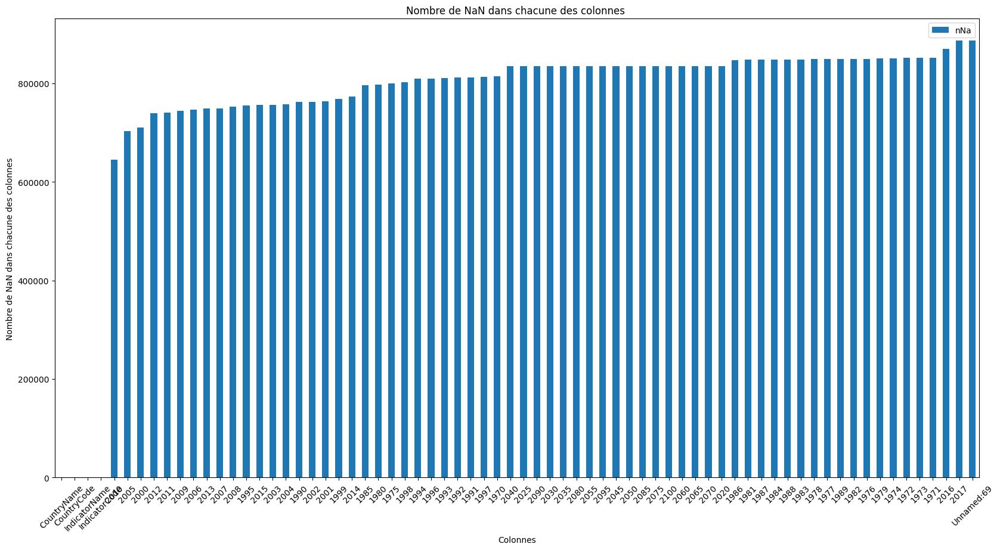

In [21]:
s.sort_values(by = "nNa", inplace = True)
p1 = s.plot.bar(x = 'colName', y = "nNa", rot = 45, figsize = [20, 10],
           title = "Nombre de NaN dans chacune des colonnes ")
p1.set_xlabel("Colonnes")
p1.set_ylabel("Nombre de NaN dans chacune des colonnes")

On va sélectionner les indices qui ont des pourcentages de NaN inférieurs ou égaux à la moyenne

In [22]:
s = s[s["nNa"] <= s.nNa.mean()]

In [23]:
df = df.loc[:,s.colName.values.tolist()]
len(df.IndicatorName.unique())

3665

# On Regarde que la liste de pays ne contienne pas des pays qui n'existe pas

In [24]:
df.CountryName.unique()

array(['Arab World', 'East Asia & Pacific',
       'East Asia & Pacific (excluding high income)', 'Euro area',
       'Europe & Central Asia',
       'Europe & Central Asia (excluding high income)', 'European Union',
       'Heavily indebted poor countries (HIPC)', 'High income',
       'Latin America & Caribbean',
       'Latin America & Caribbean (excluding high income)',
       'Least developed countries: UN classification',
       'Low & middle income', 'Low income', 'Lower middle income',
       'Middle East & North Africa',
       'Middle East & North Africa (excluding high income)',
       'Middle income', 'North America', 'OECD members', 'South Asia',
       'Sub-Saharan Africa', 'Sub-Saharan Africa (excluding high income)',
       'Upper middle income', 'World', 'Afghanistan', 'Albania',
       'Algeria', 'American Samoa', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas, The', 'Bahrain',


In [25]:
df = df[~df["CountryName"].str.contains('|'.join(["income", "World", "UN classification"]))]

In [26]:
df.CountryName.unique()

array(['East Asia & Pacific', 'Euro area', 'Europe & Central Asia',
       'European Union', 'Heavily indebted poor countries (HIPC)',
       'Latin America & Caribbean', 'Middle East & North Africa',
       'North America', 'OECD members', 'South Asia',
       'Sub-Saharan Africa', 'Afghanistan', 'Albania', 'Algeria',
       'American Samoa', 'Andorra', 'Angola', 'Antigua and Barbuda',
       'Argentina', 'Armenia', 'Aruba', 'Australia', 'Austria',
       'Azerbaijan', 'Bahamas, The', 'Bahrain', 'Bangladesh', 'Barbados',
       'Belarus', 'Belgium', 'Belize', 'Benin', 'Bermuda', 'Bhutan',
       'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei Darussalam', 'Bulgaria',
       'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon',
       'Canada', 'Cayman Islands', 'Central African Republic', 'Chad',
       'Channel Islands', 'Chile', 'China', 'Colombia', 'Comoros',
       'Congo, Dem. Rep.', 'Congo, Rep.', 'Costa Rica', "Cote

## Filtrage des données les plus pertinentes en fonction du nombre de données manquantes par indice

In [27]:
df.columns

Index(['CountryName', 'CountryCode', 'IndicatorName', 'IndicatorCode', '2010',
       '2005', '2000', '2012', '2011', '2009', '2006', '2013', '2007', '2008',
       '1995', '2015', '2003', '2004', '1990', '2002', '2001'],
      dtype='object')

In [28]:
d = df.melt(id_vars= ["IndicatorName",'CountryName'], value_vars=['2010',
       '2005', '2000', '2012', '2011', '2009', '2006', '2013', '2007', '2008',
       '1995', '2015', '2003', '2004', '1990', '2002', '2001'])
d

,IndicatorName,CountryName,variable,value
0,"Adjusted net enrolment rate, lower secondary, ...",East Asia & Pacific,2010,NaN
1,"Adjusted net enrolment rate, lower secondary, ...",East Asia & Pacific,2010,NaN
2,"Adjusted net enrolment rate, lower secondary, ...",East Asia & Pacific,2010,NaN
3,"Adjusted net enrolment rate, lower secondary, ...",East Asia & Pacific,2010,NaN
4,"Adjusted net enrolment rate, primary, both sex...",East Asia & Pacific,2010,96.166069
...,...,...,...,...
14205535,"Youth illiterate population, 15-24 years, male...",Zimbabwe,2001,NaN
14205536,"Youth literacy rate, population 15-24 years, b...",Zimbabwe,2001,NaN
14205537,"Youth literacy rate, population 15-24 years, f...",Zimbabwe,2001,NaN
14205538,"Youth literacy rate, population 15-24 years, g...",Zimbabwe,2001,NaN


In [29]:
d.columns

Index(['IndicatorName', 'CountryName', 'variable', 'value'], dtype='object')

In [30]:
d.dtypes

IndicatorName     object
CountryName       object
variable          object
value            float64
dtype: object

In [31]:
d.variable = pd.to_numeric(d.variable)
d.dtypes


IndicatorName     object
CountryName       object
variable           int64
value            float64
dtype: object

Text(0.5, 1.0, 'Nombre de ')

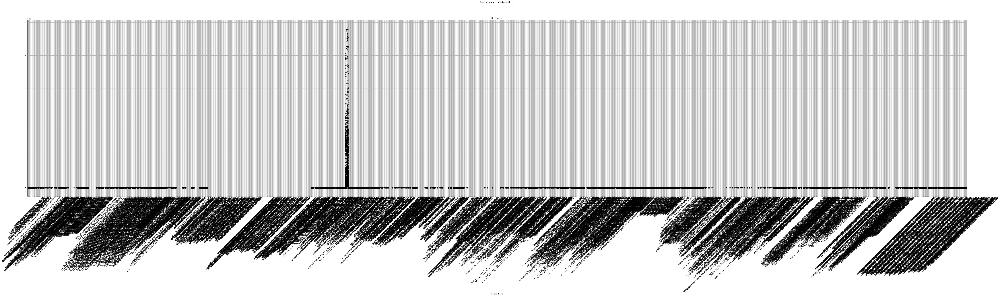

In [32]:
ax = d.boxplot("value", by = "IndicatorName", figsize = [100,20], rot= 45)
ax.set_title("Nombre de ")

On peut voir que la majorité des indices sont vides. On va donc évaluer quels indices sont vides ou non.

In [33]:
uniqueIndicator = d.IndicatorName.unique()

In [34]:
s = d.value.isnull().groupby(d["IndicatorName"]).sum()
s = pd.DataFrame(s)
print(s.value.mean(), s.value.std(), s.value.min(), s.value.max())

3219.3909959072307 918.8626624478337 47 3876


<AxesSubplot: title={'center': 'Nombre de Na pour chaque indices'}, xlabel='Nombre de Na', ylabel='Frequences'>

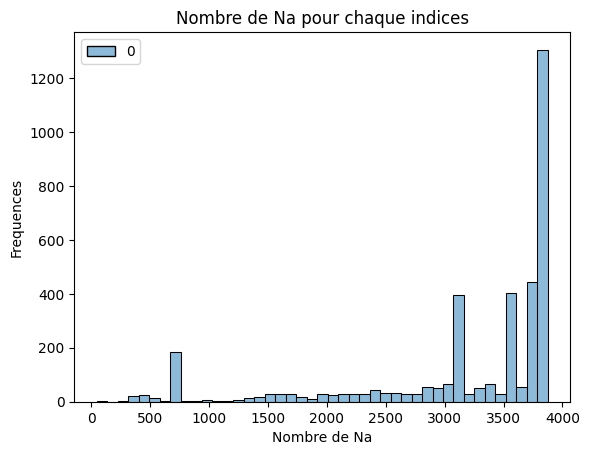

In [35]:
p = sn.histplot(s.values)
p.set(xlabel='Nombre de Na', ylabel='Frequences', title='Nombre de Na pour chaque indices')
p


Là encore la moyenne semble être un bon compromis pour enlever certains indices.

In [36]:
selectedIndicators = s[s["value"] <= s.value.mean()].index
d = d[d["IndicatorName"].isin(selectedIndicators)]
len(d.IndicatorName.unique())

1302

## Filtrage des données les plus pertinentes en fonction du nombre de données manquantes par pertinence des indices
Beaucoup d'indices comportent des mesures sur un sexe uniquement. Comme le projet vise à identifier des clients potentiels, nous n'allons pas discriminer les sexes et nous allons donc conserver uniquement les indices pour les deux sexes.

In [37]:
d = d.loc[~d["IndicatorName"].str.contains('|'.join(["male", "female"]))]

In [38]:
len(d.loc[:,"IndicatorName"].unique())

618

619 indicateurs sélectionnés pour le moment

#  Selection des indices en fonction de leurs pertinence avec le projet

## Supression d'indices relatifs à la politique éducationnelle de l'état
Ces indices non pas vraiment d'improtance pour le projet

In [39]:
d = d.loc[~d["IndicatorName"].str.contains('|'.join(["Government expenditure", "Expenditure on","Current expenditure", 
                                                     "Capital expenditure", "All staff compensation", "Official entrance", 
                                                     "Percentage of teachers", "Prevalence of HIV","Primary completion rate",
                                                     "Rate of out-of-school", "School life expectancy", "Survival rate to", 
                                                     "Teachers in", "Theoretical duration of", "Expenditure", "All staff compensation",
                                                     "Drop-out"]))]
len(d.IndicatorName.unique())

478

## Supression des tranches d'âge au delà de 29 ans
Certains indices sont catégorisés par tranche d'âge, étant donnée que le projet ce focalise sur le lycé et l'université, nous allons regrouper les catégories d'âge qui nous interresse mais aussi regrouper celle en desous puisque cela pourrais nous informer sur une masse de client futures

In [40]:
d = d.loc[~d["IndicatorName"].str.contains('|'.join(["30-34", "35-39", "40-44", "45-49", "50-54", "55-59", "60-64", "65-69", "70-74", "75+" ]))]
len(d.IndicatorName.unique())

358

In [41]:
with pd.option_context('display.max_rows', None):
    print(d.IndicatorName.unique())

['Adjusted net enrolment rate, lower secondary, both sexes (%)'
 'Adjusted net enrolment rate, lower secondary, gender parity index (GPI)'
 'Adjusted net enrolment rate, primary, both sexes (%)'
 'Adjusted net enrolment rate, primary, gender parity index (GPI)'
 'Adjusted net intake rate to Grade 1 of primary education, both sexes (%)'
 'Adjusted net intake rate to Grade 1 of primary education, gender parity index (GPI)'
 'Barro-Lee: Average years of primary schooling, age 15+, total'
 'Barro-Lee: Average years of primary schooling, age 15-19, total'
 'Barro-Lee: Average years of primary schooling, age 20-24, total'
 'Barro-Lee: Average years of primary schooling, age 25+, total'
 'Barro-Lee: Average years of primary schooling, age 25-29, total'
 'Barro-Lee: Average years of secondary schooling, age 15+, total'
 'Barro-Lee: Average years of secondary schooling, age 15-19, total'
 'Barro-Lee: Average years of secondary schooling, age 20-24, total'
 'Barro-Lee: Average years of secondary

## Supression de Barro-Lee
Barro-Lee ces indicateurs semble évaluer les données démographiques relatives à l'accès à léducation et ne sont pas pertinentes avec le projet

In [42]:
d = d.loc[~d["IndicatorName"].str.contains("Barro-Lee")]
len(d.IndicatorName.unique())

298

In [43]:
with pd.option_context('display.max_rows', None):
    print(d.IndicatorName.unique())

['Adjusted net enrolment rate, lower secondary, both sexes (%)'
 'Adjusted net enrolment rate, lower secondary, gender parity index (GPI)'
 'Adjusted net enrolment rate, primary, both sexes (%)'
 'Adjusted net enrolment rate, primary, gender parity index (GPI)'
 'Adjusted net intake rate to Grade 1 of primary education, both sexes (%)'
 'Adjusted net intake rate to Grade 1 of primary education, gender parity index (GPI)'
 'Cumulative drop-out rate to the last grade of lower secondary general education, both sexes (%)'
 'Cumulative drop-out rate to the last grade of primary education, both sexes (%)'
 'Duration of compulsory education (years)'
 'Early school leavers from primary education, both sexes (number)'
 'Effective transition rate from primary to lower secondary general education, both sexes (%)'
 'Effective transition rate from primary to lower secondary general education, gender parity index (GPI)'
 'Enrolment in early childhood education, both sexes (number)'
 'Enrolment in ea

## Indices d'interêts
1. 'GDP per capita (current US$)' indique le niveau de vie des habitants et peut donc nous informer sur la possibilité des populations à investir dans une formation.
2. 'Inbound mobility rate, both sexes (%)' 'Internet users (per 100 people)' indique l'accès à internet et donc les populations pouvant accèder à une formation en ligne
3. 'Population, age...' nous indique le nombre de populations par tranche d'âge et donc ayant potentiellement besoin d'accès à la formation
4. 'Percentage of enrolment in ...' nous indique le nombre d'individus par niveau d'éducation 

### GDP

<AxesSubplot: title={'center': 'Boxplot du PIB'}, ylabel='PIB par habitant'>

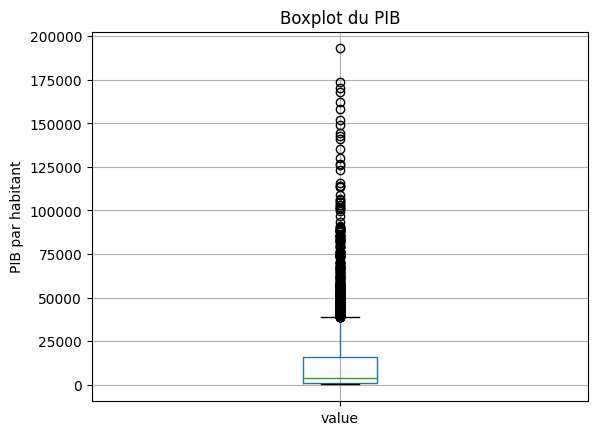

In [44]:
gdp = d[d.IndicatorName.str.contains("GDP per capita (current US$)", regex=False)]
ax = gdp.boxplot(column = "value")
ax.set_ylabel('PIB par habitant')
ax.set_title("Boxplot du PIB")
ax

### Accès internet

<AxesSubplot: title={'center': "Boxplot de nombre d'habitants ayant accès à internet"}, xlabel='Accès à internet', ylabel='Pourcentage de la population'>

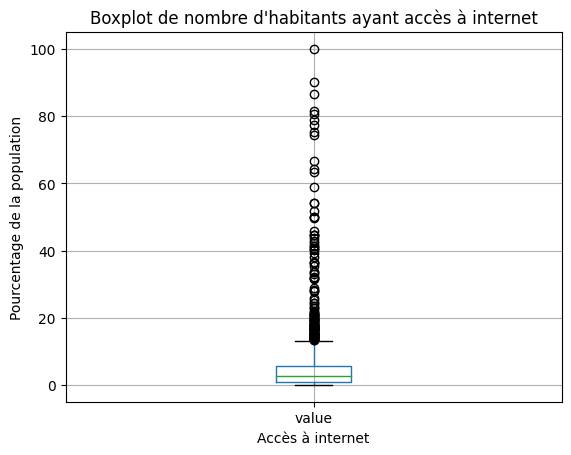

In [45]:
internet = d[d.IndicatorName.str.contains("Inbound mobility rate")]
ax = internet.boxplot(column = "value")
ax.set_xlabel('Accès à internet')
ax.set_ylabel('Pourcentage de la population')
ax.set_title("Boxplot de nombre d'habitants ayant accès à internet")
ax

### Population

#### De 0-14

<AxesSubplot: title={'center': "Boxplot de nombre d'habitants entre 0 et 14 ans"}, xlabel='Population, ages 0-14', ylabel='Nombre en milliard'>

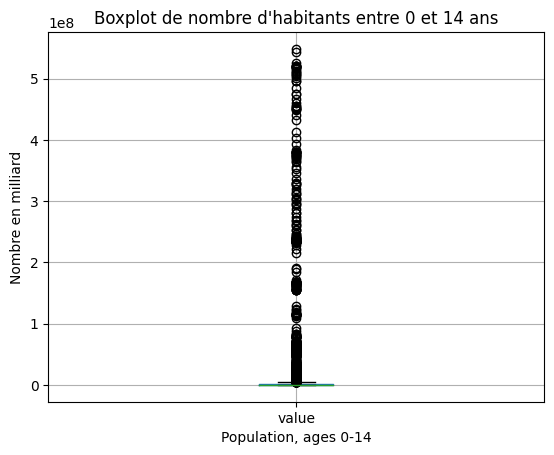

In [46]:
pop014 = d[d.IndicatorName.str.contains("Population, ages 0-14")]
ax = pop014.boxplot(column = "value")
ax.set_ylabel('Nombre en milliard')
ax.set_xlabel('Population, ages 0-14')
ax.set_title("Boxplot de nombre d'habitants entre 0 et 14 ans")
ax

#### De 15-24

<AxesSubplot: title={'center': "Boxplot de nombre d'habitants entre 15 et 24 ans"}, xlabel='Population, ages 15-24', ylabel='Nombre en milliard'>

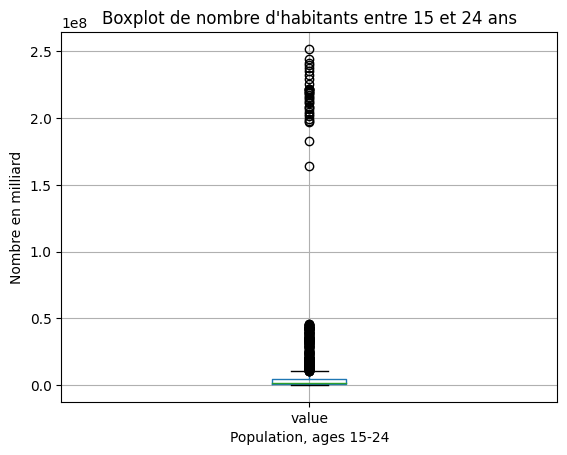

In [47]:
pop1524 = d[d.IndicatorName.str.contains("Population, ages 15-24")]
ax = pop1524.boxplot(column = "value")
ax.set_ylabel('Nombre en milliard')
ax.set_xlabel('Population, ages 15-24')
ax.set_title("Boxplot de nombre d'habitants entre 15 et 24 ans")
ax

# Evolution par années et par pays des indices

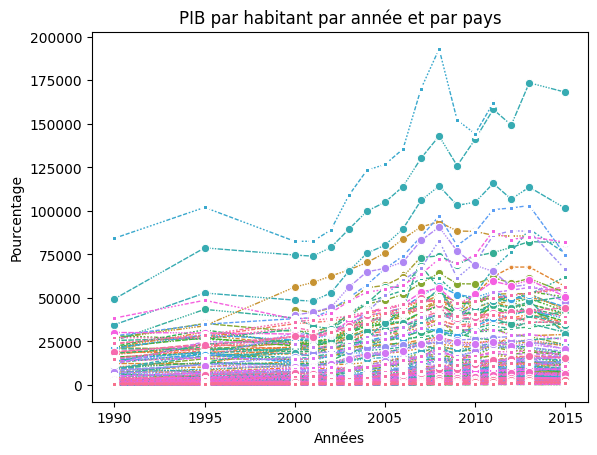

In [48]:
import seaborn as sns
ax = sns.lineplot(data=gdp, x='variable', y='value', hue= "CountryName", style="CountryName", linewidth=1, ci=None,  markers=True)
ax.set(xlabel='Années', ylabel="Pourcentage", title= "PIB par habitant par année et par pays")
plt.legend([],[], frameon=False)


On peut voir que deux pays se distingues particulièrement mais également qu'il y a une meilleur continuité entre les années 2000 et 2015

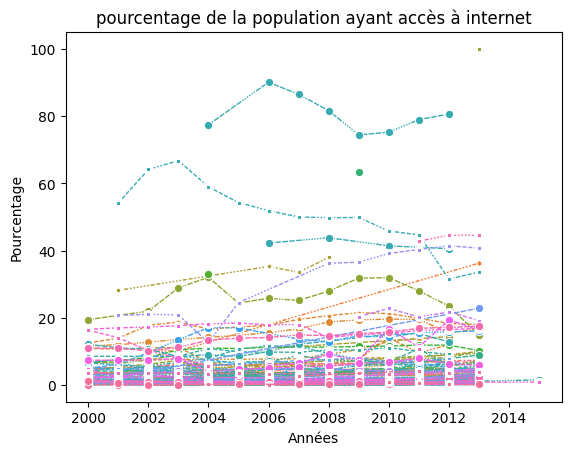

In [49]:
ax = sns.lineplot(data=internet, x='variable', y='value', hue= "CountryName", style="CountryName", linewidth=1, ci=None,  markers=True)
ax.set(xlabel='Années', ylabel="Pourcentage", title= "pourcentage de la population ayant accès à internet")
plt.legend([],[], frameon=False)

On peut voir une meilleur continuité entre les années 2000 et 2013

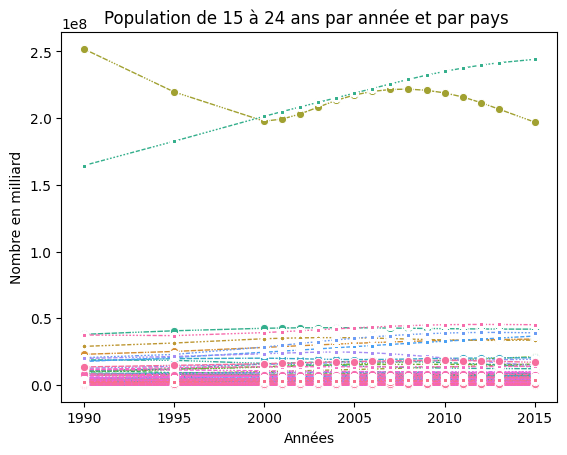

In [50]:
ax = sns.lineplot(data=pop1524, x='variable', y='value', hue= "CountryName", style="CountryName", linewidth=1, ci=None,  markers=True)
ax.set(xlabel='Années', ylabel="Nombre en milliard", title= "Population de 15 à 24 ans par année et par pays ")
plt.legend([],[], frameon=False)

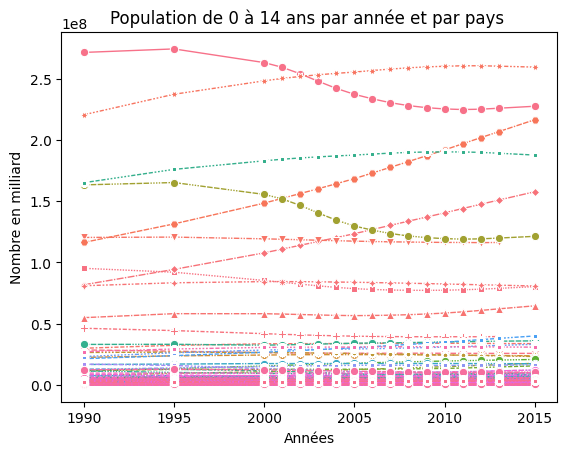

In [51]:
ax = sns.lineplot(data=pop014, x='variable', y='value', hue= "CountryName", style="CountryName", linewidth=1, ci=None,  markers=True)
ax.set(xlabel='Années', ylabel="Nombre en milliard", title= "Population de 0 à 14 ans par année et par pays ")
plt.legend([],[], frameon=False)

On garde les années comprise entre 2000 et 2014

In [52]:
gdp = gdp[(gdp["variable"] >= 2000) & (gdp["variable"] <= 2013)]
internet = internet[(internet["variable"] >= 2000) & (internet["variable"] <= 2013)]
pop1524 = pop1524[(pop1524["variable"] >= 2000) & (pop1524["variable"] <= 2013)]
pop014 = pop014[(pop014["variable"] >= 2000) & (pop014["variable"] <= 2013)]

# Evaluation des meilleures pays par indices toutes années confondus

## GDP

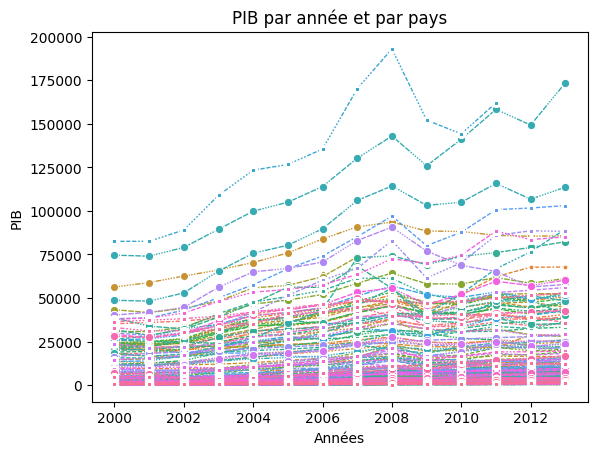

In [53]:
ax = sns.lineplot(data=gdp, x='variable', y='value', hue= "CountryName", style="CountryName", linewidth=1, ci=None,  markers=True)
ax.set(xlabel='Années', ylabel="PIB", title= "PIB par année et par pays")
plt.legend([],[], frameon=False)

In [54]:
tmp = d[(d.IndicatorName.str.contains("GDP per capita (current US$)", regex=False))]
tmp = tmp[tmp["value"] >= 50000]
tmp.CountryName.unique()

array(['Australia', 'Bermuda', 'Denmark', 'Isle of Man', 'Liechtenstein',
       'Luxembourg', 'Macao SAR, China', 'Monaco', 'Netherlands',
       'Norway', 'Qatar', 'San Marino', 'Sweden', 'Switzerland',
       'Channel Islands', 'Iceland', 'Ireland', 'North America', 'Canada',
       'Kuwait', 'Singapore', 'United States', 'Austria', 'Faroe Islands',
       'Finland', 'Cayman Islands', 'United Kingdom'], dtype=object)

Voici les pays dont le PIB est supérieur à 50000

## Accès à internet

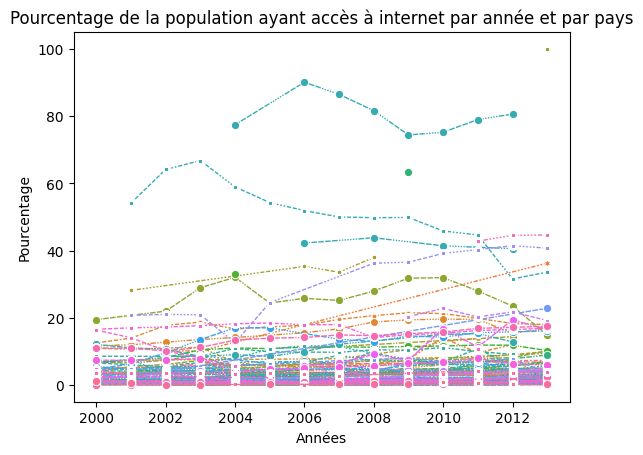

In [55]:
ax = sns.lineplot(data=internet, x='variable', y='value', hue= "CountryName", style="CountryName", linewidth=1, ci=None,  markers=True)
ax.set(xlabel='Années', ylabel="Pourcentage", title= "Pourcentage de la population ayant accès à internet par année et par pays")
plt.legend([],[], frameon=False)

In [56]:
tmp = d[(d.IndicatorName.str.contains("Inbound mobility rate"))]
tmp = tmp[tmp["value"] >= 30]
tmp.CountryName.unique()

array(['Cyprus', 'Liechtenstein', 'Luxembourg', 'Macao SAR, China',
       'Qatar', 'United Arab Emirates', 'Grenada', 'Cayman Islands',
       'Andorra', 'Curacao', 'Fiji'], dtype=object)

Voici les pyas on au moins 30% de la populaiton on accès à internet.

## Population

### De 0-14 and

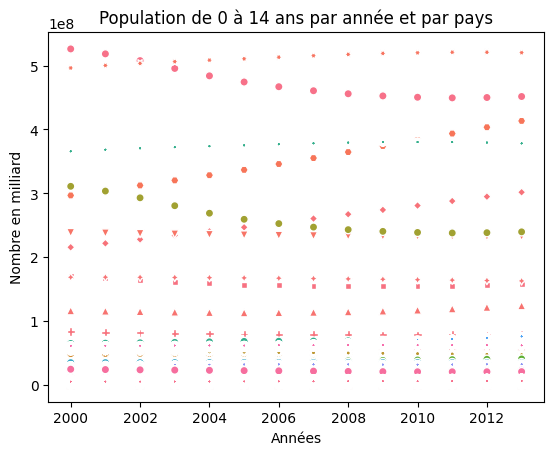

In [57]:
ax = sns.scatterplot(data=pop014, x='variable', y='value', hue= "CountryName", style="CountryName", linewidth=1, ci=None,  markers=True)
ax.set(xlabel='Années', ylabel="Nombre en milliard", title= "Population de 0 à 14 ans par année et par pays")
plt.legend([],[], frameon=False)

In [58]:
tmp = d[(d.IndicatorName.str.contains("Population, ages 0-14"))]
tmp = tmp[tmp["value"] > 4.0000e+08]
tmp.CountryName.unique()

array(['East Asia & Pacific', 'South Asia', 'Sub-Saharan Africa'],
      dtype=object)

Voici les pays don le nombre de population entre 0 et 14 ans sont les plus élevés

### De 15 à 24 ans

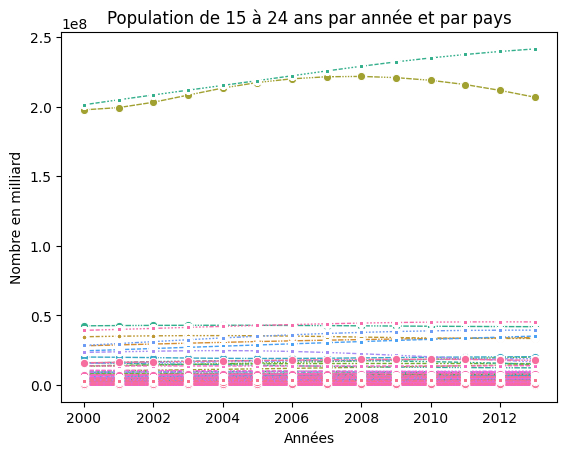

In [59]:
ax = sns.lineplot(data=pop1524, x='variable', y='value', hue= "CountryName", style="CountryName", linewidth=1, ci=None,  markers=True)
ax.set(xlabel='Années', ylabel="Nombre en milliard", title= "Population de 15 à 24 ans par année et par pays")
plt.legend([],[], frameon=False)

In [60]:
tmp = d[(d.IndicatorName.str.contains("Population, ages 15-24"))]
tmp = tmp[tmp["value"] >= 2.0e+08]
tmp.CountryName.unique().tolist()

['China', 'India']

Voici les deux pays dont les populations actuelles sont les plus importantes

# Selection des indices sur la dernière période

In [73]:
gdp.groupby(level = 0).mean()

,variable,value,score.gdp
1245,2010.0,7679.834203,-0.272344
4910,2010.0,37617.721751,1.166762
8575,2010.0,23536.905927,0.489901
12240,2010.0,33558.684857,0.971645
15905,2010.0,742.471894,-0.605821
...,...,...,...
14188460,2001.0,NaN,NaN
14192125,2001.0,1335.553195,-0.577312
14195790,2001.0,535.833052,-0.615754
14199455,2001.0,378.273624,-0.623328


In [100]:
tmp = tmp[~tmp.value.isna()]
tmp[tmp["variable"] ==  tmp["variable"].max()]

,IndicatorName,CountryName,variable,value,score.gdp
6682540,GDP per capita (current US$),Zimbabwe,2013,1026.388289,-0.592174


In [88]:
def keepLastValue(data):
    contries = data.CountryName.unique()
    result = []
    for a in range(len(contries)):
        tmp = data[data["CountryName"] == contries[a]]
        tmp = tmp[~tmp.value.isna()] # là ou l'indicateur n'est pas NaN
        result.append(tmp[tmp["variable"] ==  tmp["variable"].max()]) # l'année la plus récente
    result = pd.concat(result)
    return result

In [90]:
gdp = keepLastValue(gdp)
internet = keepLastValue(internet)
pop014 = keepLastValue(pop014)
pop1524 = keepLastValue(pop1524)

# Scoring

In [101]:
gdp["score.gdp"] = scale(gdp, "value")
internet["score.internet"] = scale(internet, "value")
pop014["score.pop014"] = scale(pop014, "value")
pop1524["score.pop1524"] = scale(pop1524, "value")

On rajoute également un facteur de pondération avec une valeur de 100 pour l'accès à internet, une valeur de 75 pour le PIB, une valeur de 50 pour la population comprise entre 14 et 24 ans et une valeur de 25 pour la population comprise entre 0 et 14 ans

In [ ]:
data = pd.merge(gdp, internet.loc[:,["CountryName", "variable", "score.internet"]], on=["CountryName", "variable"])
data = pd.merge(data, pop014.loc[:,["CountryName", "variable", "score.pop014"]], on=["CountryName", "variable"])
data = pd.merge(data, pop1524.loc[:,["CountryName", "variable", "score.pop1524"]], on=["CountryName", "variable"])
data["score"] = data["score.gdp"]*75 + data["score.internet"]*100 + data["score.pop014"]*25 + data["score.pop1524"]*50 
data["score"].hist()
data = data.sort_values('score')

Corrélation des indices entre eux

<AxesSubplot: >

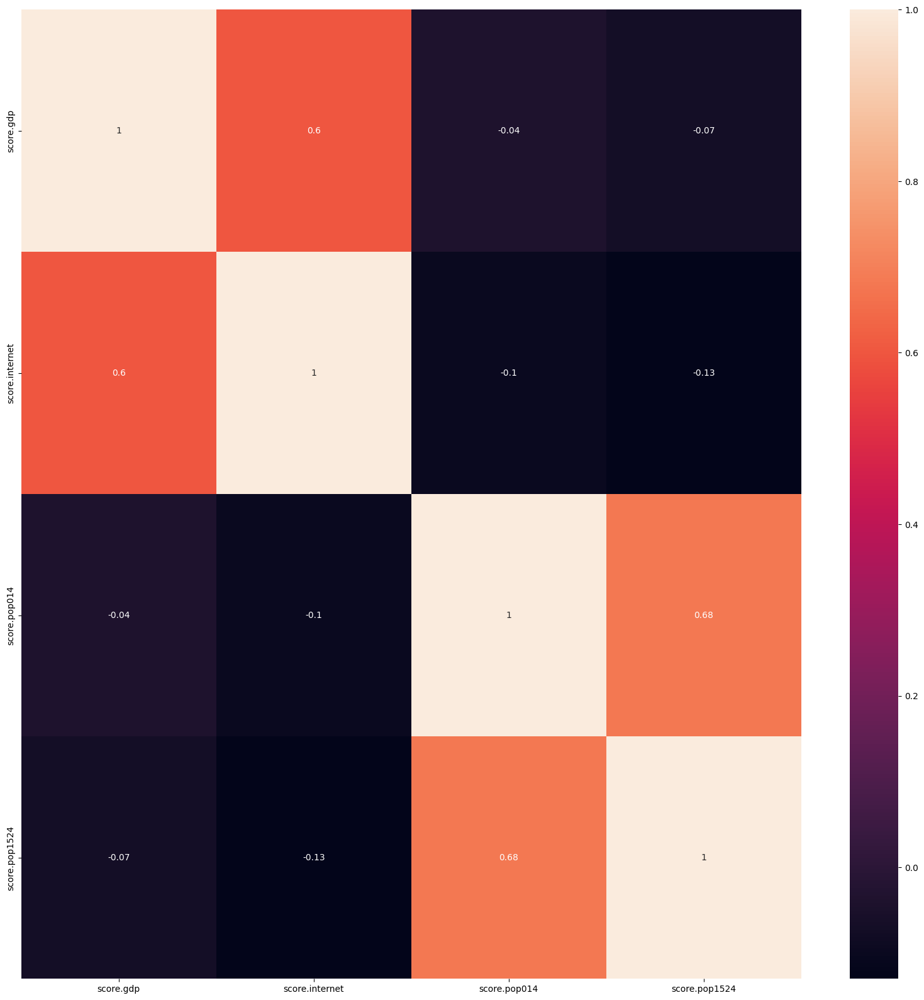

In [106]:
matrix = data.loc[:,["score.gdp", "score.internet", "score.pop014","score.pop1524"]].corr().round(2)
plt.figure(figsize=(20,20))
sn.heatmap(matrix, annot=True)

In [107]:
data[data["score"] >=  data["score"].mean()].CountryName.unique().tolist()

['Russian Federation',
 'Czech Republic',
 'Greece',
 'Saudi Arabia',
 'Brunei Darussalam',
 'Israel',
 'Netherlands',
 'Spain',
 'Hong Kong SAR, China',
 'Korea, Rep.',
 'Finland',
 'Ireland',
 'Trinidad and Tobago',
 'Lebanon',
 'Mexico',
 'Brazil',
 'Indonesia',
 'Aruba',
 'Italy',
 'Iceland',
 'St. Lucia',
 'Barbados',
 'Sweden',
 'France',
 'Denmark',
 'Belgium',
 'Bangladesh',
 'Norway',
 'Austria',
 'Australia',
 'New Zealand',
 'Japan',
 'Cyprus',
 'Pakistan',
 'United Kingdom',
 'Qatar',
 'Germany',
 'Fiji',
 'Switzerland',
 'United States',
 'Singapore',
 'Macao SAR, China',
 'United Arab Emirates',
 'Grenada',
 'Luxembourg',
 'India',
 'China']

Voici les pays dont les scores sont supérieurs à la moyenne (classés par ordre croissant)